<a href="https://colab.research.google.com/github/R-Madhuram/DartmouthCapstone_CrudeOilPricePrediction/blob/main/Copy_1_Seasonal_Decompose_Auto_ARIMA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TSA with Seasonal Decomposition and Auto-ARIMA

# Import Libraries

In [ ]:
#import libraries
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns; sns.set(style='whitegrid')
sns.set_context(context='paper',font_scale=1.5)
%matplotlib inline

#import utilities as util

#ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

from statsmodels.tsa.stattools import adfuller
import statsmodels.formula.api as smf
import statsmodels.tsa.api as smt
import statsmodels.api as sm
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import pacf
from statsmodels.tsa import arima_process


from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.linear_model import LinearRegression, ElasticNet,Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_squared_log_error
import io

import itertools


import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Load Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# load data
us_cushing = pd.read_csv('/content/drive/MyDrive/PCDS_OilPricePrediction/data/USCushing.csv')
eu_brent = pd.read_csv('/content/drive/MyDrive/PCDS_OilPricePrediction/data/EuropeanBrent.csv')


## Cushing Data

In [ ]:
# Read data 
us_cushing.head().append(us_cushing.tail())

,Date,"Cushing, OK WTI Spot Price FOB (Dollars per Barrel)"
0,"Jan 02, 1986",25.56
1,"Jan 03, 1986",26.00
2,"Jan 06, 1986",26.53
3,"Jan 07, 1986",25.85
4,"Jan 08, 1986",25.87
9357,"Feb 22, 2023",73.95
9358,"Feb 23, 2023",75.26
9359,"Feb 24, 2023",76.19
9360,"Feb 27, 2023",75.57
9361,NaN,NaN


## Brent Data

In [ ]:
# Read data
eu_brent.head().append(eu_brent.tail())

,Date,Europe Brent Spot Price FOB (Dollars per Barrel)
0,"May 20, 1987",18.63
1,"May 21, 1987",18.45
2,"May 22, 1987",18.55
3,"May 25, 1987",18.60
4,"May 26, 1987",18.63
9077,"Feb 22, 2023",79.55
9078,"Feb 23, 2023",82.08
9079,"Feb 24, 2023",82.31
9080,"Feb 27, 2023",82.31
9081,NaN,NaN


# Creating dataframe with date as index and changing date as date-time object

## Cushing Data

In [ ]:
# Convert the date to dateimte object 
us_cushing['Date'] = pd.to_datetime(us_cushing['Date'], format = '%b %d, %Y')

In [ ]:
print(us_cushing['Date'].dtype)

datetime64[ns]


In [ ]:
# rename price column
us_cushing.rename(columns={'Cushing, OK WTI Spot Price FOB (Dollars per Barrel)':'price'},inplace=True)

In [ ]:
cushing_df = us_cushing

In [ ]:
cushing_df = cushing_df[:-1]
cushing_df

,Date,price
0,1986-01-02,25.56
1,1986-01-03,26.00
2,1986-01-06,26.53
3,1986-01-07,25.85
4,1986-01-08,25.87
...,...,...
9356,2023-02-21,76.28
9357,2023-02-22,73.95
9358,2023-02-23,75.26
9359,2023-02-24,76.19


In [ ]:
# Change the index of the Df as date index
# cushing_df.index = pd.date_range(start='01-02-1986', end='02-27-2023', freq='D')
cushing_df = cushing_df.set_index('Date')

In [ ]:
cushing_df.index = pd.DatetimeIndex(cushing_df.index).to_period('D')
cushing_df

,price
Date,
1986-01-02,25.56
1986-01-03,26.00
1986-01-06,26.53
1986-01-07,25.85
1986-01-08,25.87
...,...
2023-02-21,76.28
2023-02-22,73.95
2023-02-23,75.26


## Brent Data

In [ ]:
# Convert the date to dateimte object 
eu_brent['Date'] = pd.to_datetime(eu_brent['Date'], format = '%b %d, %Y')

In [ ]:
print(eu_brent['Date'].dtype)

datetime64[ns]


In [ ]:
# rename price column
eu_brent.rename(columns={'Europe Brent Spot Price FOB (Dollars per Barrel)':'price'},inplace=True)
eu_brent

,Date,price
0,1987-05-20,18.63
1,1987-05-21,18.45
2,1987-05-22,18.55
3,1987-05-25,18.60
4,1987-05-26,18.63
...,...,...
9077,2023-02-22,79.55
9078,2023-02-23,82.08
9079,2023-02-24,82.31
9080,2023-02-27,82.31


In [ ]:
brent_df = eu_brent
brent_df = brent_df[:-1]

In [ ]:
# Change the index of the Df as date index
# brent_df.index = pd.date_range(start='05-20-1987', end='02-27-2023', freq='D')
brent_df = brent_df.set_index('Date')

In [ ]:
brent_df.index = pd.DatetimeIndex(brent_df.index).to_period('D')
brent_df

,price
Date,
1987-05-20,18.63
1987-05-21,18.45
1987-05-22,18.55
1987-05-25,18.60
1987-05-26,18.63
...,...
2023-02-21,82.14
2023-02-22,79.55
2023-02-23,82.08


# Time Series Plot 

## Cushing Data

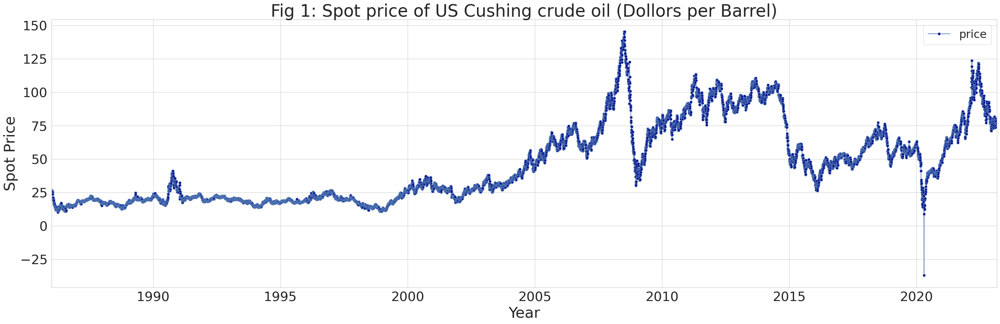

In [ ]:
# Time Series Plot of the Cushing data
fig_1 = cushing_df.squeeze().plot(figsize=(35,10),markersize=10, markerfacecolor= 'darkblue',marker='.',grid=True)
plt.legend(fontsize=23)
plt.title("Fig 1: Spot price of US Cushing crude oil (Dollors per Barrel)",fontsize=35)
plt.xlabel("Year", fontsize=31)
plt.ylabel("Spot Price",fontsize=31)
plt.xticks(fontsize=27)
plt.yticks(fontsize=27)
plt.savefig('fig_1_Cushing_ts.png')

## Brent Data

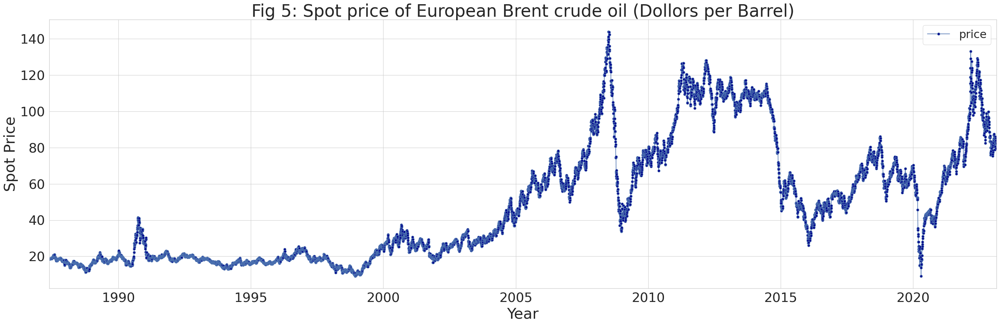

In [ ]:
# Time series plot Eropean Brent crude oil price data
fig_5 = brent_df.squeeze().plot(figsize=(35,10),markersize=10, markerfacecolor= 'darkblue',marker='.',grid=True)
plt.legend(fontsize=23)
plt.title("Fig 5: Spot price of European Brent crude oil (Dollors per Barrel)",fontsize=35)
plt.xlabel("Year", fontsize=31)
plt.ylabel("Spot Price",fontsize=31)
plt.xticks(fontsize=27)
plt.yticks(fontsize=27)
plt.savefig('fig_5_Brent_ts.png')

# Time-Series Analysis of sale price of crude oil

## Cushing Data

### Stationarity of the signal

In [ ]:
# Ad-fuller test to check the stationarity of the signal
cushing_residue_price = adfuller(cushing_df['price'])
ans_cushing = 'stationary' if cushing_residue_price[1] < 0.05 else 'not stationary'
print(cushing_residue_price)
print(ans_cushing)

(-2.367282906696632, 0.15118424280209203, 38, 9322, {'1%': -3.4310516843596464, '5%': -2.861850100263371, '10%': -2.5669350612883703}, 33326.873143386205)
not stationary


### Use sample partial autocorrelation (PACF) and sample autocorrelation (ACF) function to select order(s) (p,q) of AR and MA process respectively

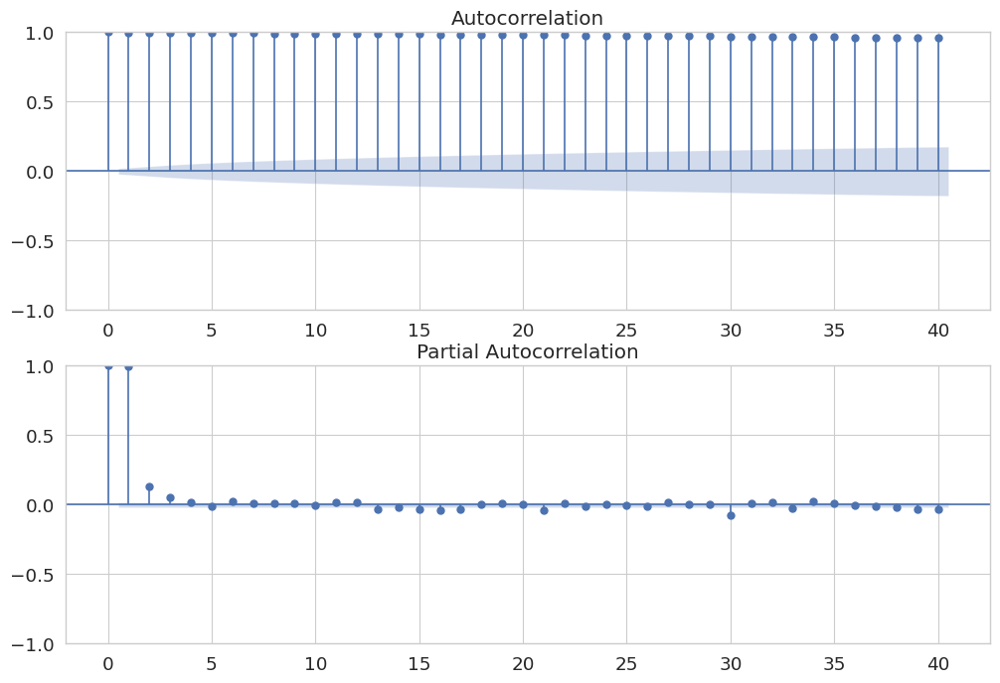

In [ ]:
# ACF and PACF Plots to determine AR and MA process orders
f, ax = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
plt.title('Fig 15: ACF and PACF plots of sale Price of US Cushing Crude Oil')
plot_acf(cushing_df.values.squeeze(), ax=ax[0])
plot_pacf(cushing_df.values.squeeze(), ax=ax[1], method='ols')
plt.savefig('fig_15_cushing_ACF_plts.png')

## Brent Data

### Stationarity of the signal

In [ ]:
# Ad-fuller test to check the stationarity of the signal
brent_residue_price = adfuller(brent_df['price'])
ans_brent = 'stationary' if brent_residue_price[1] < 0.05 else 'not stationary'
print(brent_residue_price)
print(ans_brent)

(-2.1078324090273384, 0.24137683641020097, 29, 9051, {'1%': -3.4310726997648144, '5%': -2.8618593866183164, '10%': -2.5669400044583415}, 29239.71867660825)
not stationary


### Use sample partial autocorrelation (PACF) and sample autocorrelation (ACF) function to select order(s) (p,q) of AR and MA process respectively

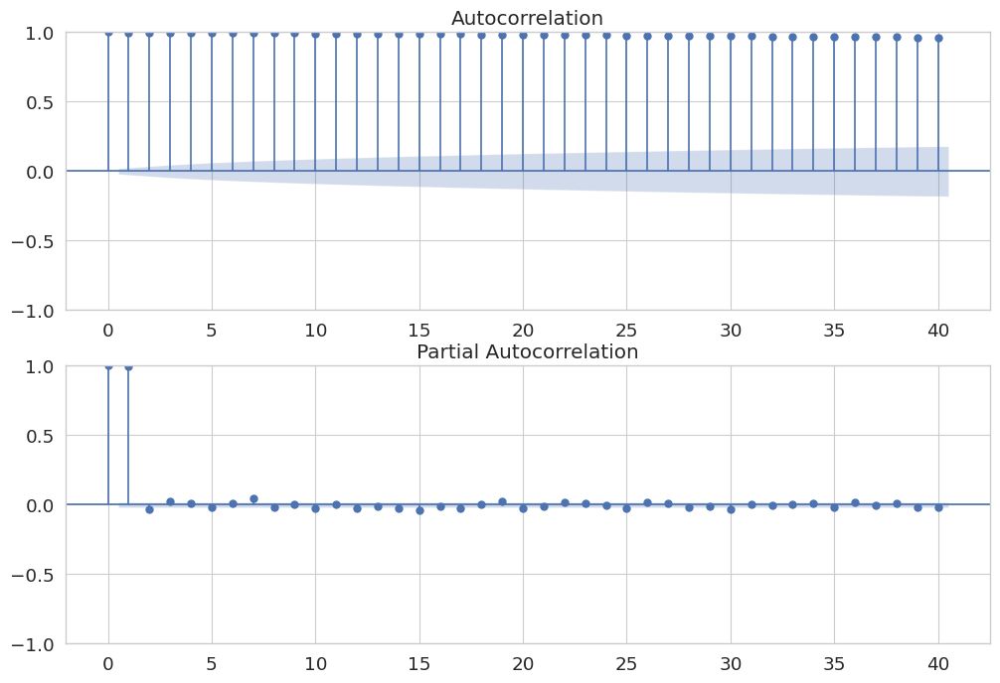

In [ ]:
# ACF and PACF Plots to determine AR and MA process orders
f, ax = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
plt.title('Fig 16: ACF and PACF plots of sale Price of European Brent Crude Oil')
plot_acf(brent_df['price'], ax=ax[0])
plot_pacf(brent_df['price'], ax=ax[1], method='ols')
plt.savefig('fig_16_brent_ACF_plts.png')

# Modeling with ARMA Family of models

## Cushing Data

In [ ]:
# split the available data as historical and future for computing forecast error 
cushing_seasonal = cushing_df
cushing_seasonal.index = cushing_seasonal.index.to_timestamp()
cushing_y_hist = cushing_seasonal.loc['1986':'2021','price'] 
cushing_y_future = cushing_seasonal.loc['2022':, 'price']
cushing_y_hist, cushing_y_future

(Date
 1986-01-02    25.56
 1986-01-03    26.00
 1986-01-06    26.53
 1986-01-07    25.85
 1986-01-08    25.87
               ...  
 2021-12-27    75.49
 2021-12-28    76.01
 2021-12-29    76.58
 2021-12-30    76.83
 2021-12-31    75.33
 Name: price, Length: 9072, dtype: float64,
 Date
 2022-01-03    75.99
 2022-01-04    77.00
 2022-01-05    77.83
 2022-01-06    79.47
 2022-01-07    79.00
               ...  
 2023-02-21    76.28
 2023-02-22    73.95
 2023-02-23    75.26
 2023-02-24    76.19
 2023-02-27    75.57
 Name: price, Length: 289, dtype: float64)

### 0) Seasonal Decomposition

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose


In [ ]:
# FInding if there are any negative values in price
print(len(cushing_y_hist))
print(260*36)
print(np.where(cushing_y_hist<=0))
cushing_df.iloc[8643]

9323
9360
(array([8643]),)


price   -36.98
Name: 2020-04-20 00:00:00, dtype: float64

In [ ]:
# removing negative values
cushing_y_hist=cushing_y_hist.drop(cushing_y_hist.index[8643])

In [ ]:
# Seasonal decomposition of the time series

period =  253 #number of business days multiplied by time period
c_sd_result = seasonal_decompose(cushing_y_hist, period = period, model = 'multiplicative', extrapolate_trend = True)
print(c_sd_result.trend.size)
print(c_sd_result.seasonal.size)

9071
9071


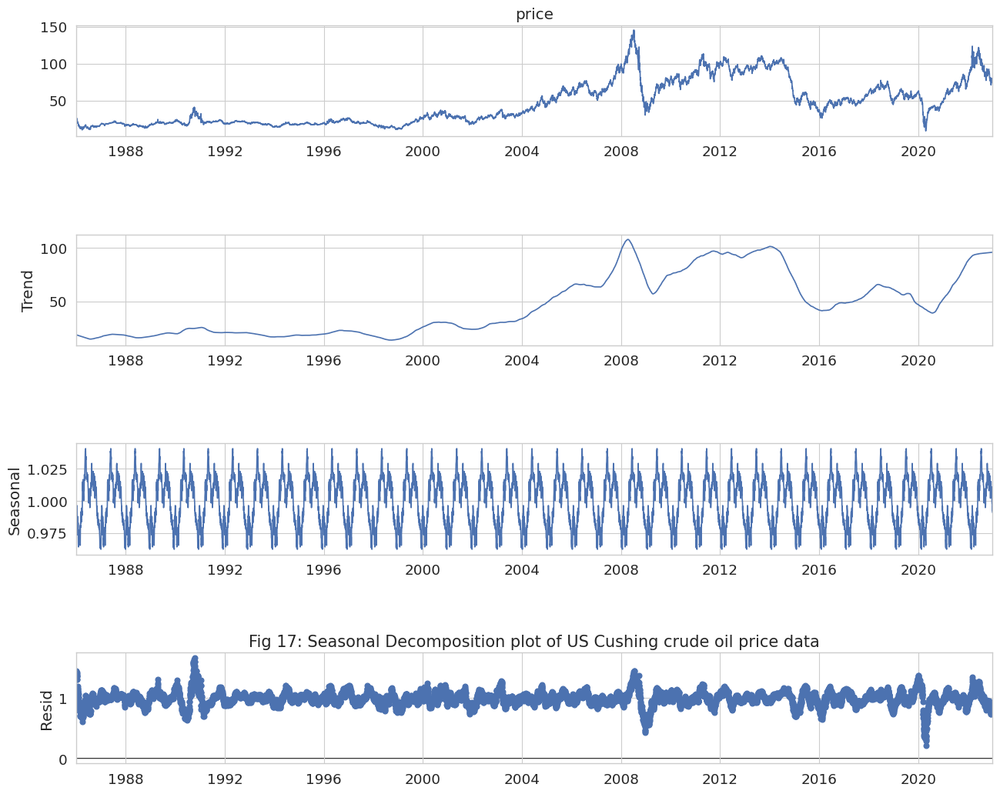

In [ ]:
# Plotting the seasonal decomposition

fig_c_hist_decomp = c_sd_result.plot()
fig_c_hist_decomp.set_size_inches(15, 12) 
plt.title('Fig 17: Seasonal Decomposition plot of US Cushing crude oil price data', fontsize=15)
plt.savefig('fig_17_cushing_decomp.png')

In [ ]:
# Hypothesis Testing for Stationarity using Dicky Fuller Test

sd_residue = adfuller(c_sd_result.resid)
c_sd_ans = 'stationary' if adfuller(c_sd_result.resid)[1] < 0.05 else 'not stationary'
print(sd_residue)
print('The residue is '+c_sd_ans+'.')

(-11.681003998497298, 1.7414641891369984e-21, 38, 9283, {'1%': -3.431054633111431, '5%': -2.8618514032712694, '10%': -2.5669357548848586}, -42513.68477023691)
The residue is stationary.


### 1) Auto-ARIMA

In [ ]:
!pip install pmdarima

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 57.1 MB/s eta 0:00:00


In [ ]:
from pmdarima.arima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from pmdarima.arima import StepwiseContext


In [ ]:
# Model Creation using Auto-ARIMA
with StepwiseContext(max_dur=25):
  cushing_auto_arima_model = auto_arima(y=cushing_y_hist,
                                seasonal=True, 
                                stationary = False,                            
                                information_criterion="aic",
                                stepwise=True,
                                parallel=True,
                                trace=True,
                                m=22,
                                with_intercept = True,
                                random_state = 42,
                                n_jobs=3,start_p = 2,
                                max_p = 5,start_q = 0,
                                max_q = 2,
                                max_P = 1, max_Q = 1
                                )
cushing_order = cushing_auto_arima_model.get_params().get("order")

/usr/local/lib/python3.9/dist-packages/pmdarima/arima/_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


Performing stepwise search to minimize aic
 ARIMA(2,1,0)(1,0,1)[22] intercept   : AIC=28750.678, Time=11.52 sec
 ARIMA(0,1,0)(0,0,0)[22] intercept   : AIC=28763.012, Time=0.18 sec
 ARIMA(1,1,0)(1,0,0)[22] intercept   : AIC=28750.756, Time=5.12 sec
 ARIMA(0,1,1)(0,0,1)[22] intercept   : AIC=28750.079, Time=7.03 sec
 ARIMA(0,1,0)(0,0,0)[22]             : AIC=28761.208, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[22] intercept   : AIC=28748.134, Time=0.70 sec
 ARIMA(0,1,1)(1,0,0)[22] intercept   : AIC=28750.078, Time=6.54 sec
 ARIMA(0,1,1)(1,0,1)[22] intercept   : AIC=28752.054, Time=9.50 sec
 ARIMA(1,1,1)(0,0,0)[22] intercept   : AIC=28747.955, Time=1.77 sec

Best model:  ARIMA(1,1,1)(0,0,0)[22] intercept
Total fit time: 42.646 seconds


/usr/local/lib/python3.9/dist-packages/pmdarima/arima/_auto_solvers.py:326: UserWarning: early termination of stepwise search due to max_dur threshold (42.513 > 25.000)
  warnings.warn('early termination of stepwise search due to '


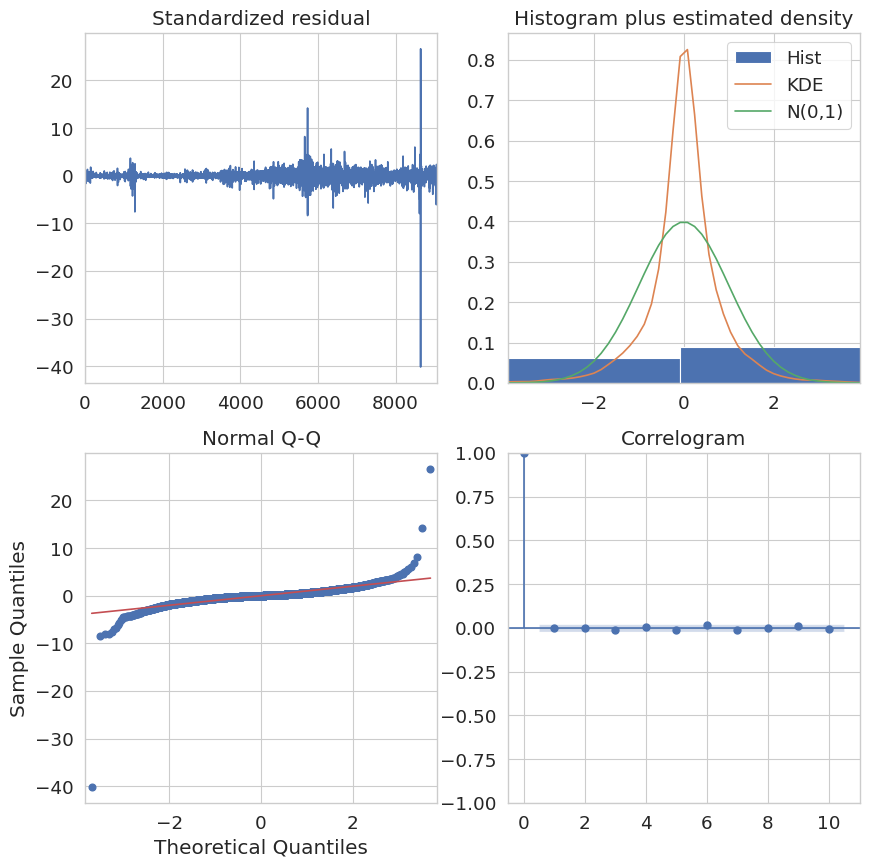

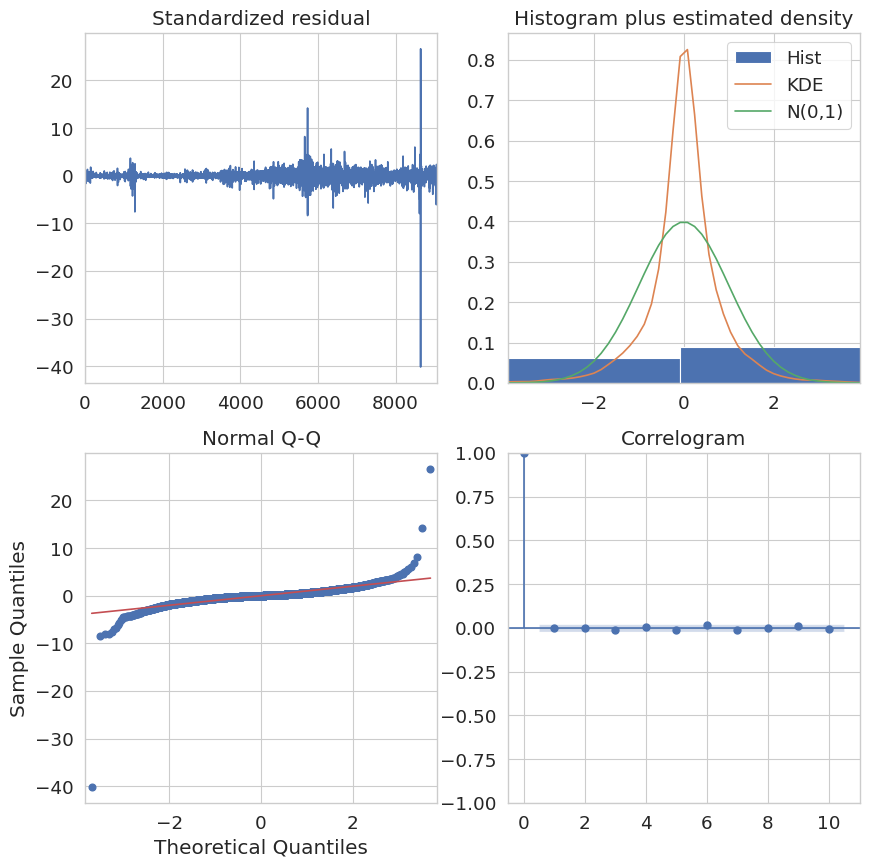

In [ ]:
cushing_auto_arima_model.plot_diagnostics(figsize=(10,10))

In [ ]:
# Cross validation using sliding window
import pmdarima as pm
from pmdarima import model_selection

In [ ]:
cv_autoarima = model_selection.SlidingWindowForecastCV(h=22, 
                                                 step=(22),         #can also be considered as cycle of forecasting
                                                 window_size=(253*2)
                                                 )

cv_score = model_selection.cross_val_score(estimator = cushing_auto_arima_model,
                                           y = cushing_y_hist,
                                           scoring = 'mean_squared_error',
                                           cv = cv_autoarima,
                                           verbose = 2,
                                           error_score= 100000000000000000)


[CV] fold=0 ..........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=1 ..........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=2 ..........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=3 ..........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=4 ..........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=5 ..........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=6 ..........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=7 ..........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=8 ..........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=9 ..........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=10 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=11 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=12 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=13 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=14 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=15 .........................................................
[CV] fold=16 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=17 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=18 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=19 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=20 .........................................................
[CV] fold=21 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=22 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=23 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=24 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=25 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=26 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=27 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=28 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=29 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=30 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=31 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=32 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=33 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=34 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=35 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=36 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=37 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=38 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=39 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=40 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=41 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=42 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=43 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=44 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=45 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=46 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=47 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=48 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=49 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=50 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=51 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=52 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=53 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=54 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=55 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=56 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=57 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=58 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=59 .........................................................
[CV] fold=60 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=61 .........................................................
[CV] fold=62 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=63 .........................................................
[CV] fold=64 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=65 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=66 .........................................................
[CV] fold=67 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=68 .........................................................
[CV] fold=69 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=70 .........................................................
[CV] fold=71 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=72 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=73 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=74 .........................................................
[CV] fold=75 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=76 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=77 .........................................................
[CV] fold=78 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=79 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=80 .........................................................
[CV] fold=81 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=82 .........................................................
[CV] fold=83 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=84 .........................................................
[CV] fold=85 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=86 .........................................................
[CV] fold=87 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=88 .........................................................
[CV] fold=89 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=90 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=91 .........................................................
[CV] fold=92 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=93 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=94 .........................................................
[CV] fold=95 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=96 .........................................................
[CV] fold=97 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=98 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=99 .........................................................
[CV] fold=100 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=101 ........................................................
[CV] fold=102 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=103 ........................................................
[CV] fold=104 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=105 ........................................................
[CV] fold=106 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=107 ........................................................
[CV] fold=108 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=109 ........................................................
[CV] fold=110 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=111 ........................................................
[CV] fold=112 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=113 ........................................................
[CV] fold=114 ........................................................
[CV] fold=115 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=116 ........................................................
[CV] fold=117 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=118 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=119 ........................................................
[CV] fold=120 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=121 ........................................................
[CV] fold=122 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=123 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=124 ........................................................
[CV] fold=125 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=126 ........................................................
[CV] fold=127 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=128 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=129 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=130 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=131 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=132 ........................................................
[CV] fold=133 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=134 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=135 ........................................................
[CV] fold=136 ........................................................
[CV] fold=137 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=138 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=139 ........................................................
[CV] fold=140 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=141 ........................................................
[CV] fold=142 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=143 ........................................................
[CV] fold=144 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=145 ........................................................
[CV] fold=146 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=147 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=148 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=149 ........................................................
[CV] fold=150 ........................................................
[CV] fold=151 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=152 ........................................................
[CV] fold=153 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=154 ........................................................
[CV] fold=155 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=156 ........................................................
[CV] fold=157 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=158 ........................................................
[CV] fold=159 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=160 ........................................................
[CV] fold=161 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=162 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=163 ........................................................
[CV] fold=164 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=165 ........................................................
[CV] fold=166 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=167 ........................................................
[CV] fold=168 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=169 ........................................................
[CV] fold=170 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=171 ........................................................
[CV] fold=172 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=173 ........................................................
[CV] fold=174 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=175 ........................................................
[CV] fold=176 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=177 ........................................................
[CV] fold=178 ........................................................
[CV] fold=179 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=180 ........................................................
[CV] fold=181 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=182 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=183 ........................................................
[CV] fold=184 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=185 ........................................................
[CV] fold=186 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=187 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=188 ........................................................
[CV] fold=189 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=190 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=191 ........................................................
[CV] fold=192 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=193 ........................................................
[CV] fold=194 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=195 ........................................................
[CV] fold=196 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=197 ........................................................
[CV] fold=198 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=199 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=200 ........................................................
[CV] fold=201 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=202 ........................................................
[CV] fold=203 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=204 ........................................................
[CV] fold=205 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=206 ........................................................
[CV] fold=207 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=208 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=209 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=210 ........................................................
[CV] fold=211 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=212 ........................................................
[CV] fold=213 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=214 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=215 ........................................................
[CV] fold=216 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=217 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=218 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=219 ........................................................
[CV] fold=220 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=221 ........................................................
[CV] fold=222 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=223 ........................................................
[CV] fold=224 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=225 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=226 ........................................................
[CV] fold=227 ........................................................
[CV] fold=228 ........................................................
[CV] fold=229 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=230 ........................................................
[CV] fold=231 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=232 ........................................................
[CV] fold=233 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=234 ........................................................
[CV] fold=235 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=236 ........................................................
[CV] fold=237 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=238 ........................................................
[CV] fold=239 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=240 ........................................................
[CV] fold=241 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=242 ........................................................
[CV] fold=243 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=244 ........................................................
[CV] fold=245 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=246 ........................................................
[CV] fold=247 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=248 ........................................................
[CV] fold=249 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=250 ........................................................
[CV] fold=251 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=252 ........................................................
[CV] fold=253 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=254 ........................................................
[CV] fold=255 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=256 ........................................................
[CV] fold=257 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=258 ........................................................
[CV] fold=259 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=260 ........................................................
[CV] fold=261 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=262 ........................................................
[CV] fold=263 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=264 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=265 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=266 ........................................................
[CV] fold=267 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=268 ........................................................
[CV] fold=269 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=270 ........................................................
[CV] fold=271 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=272 ........................................................
[CV] fold=273 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=274 ........................................................
[CV] fold=275 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=276 ........................................................
[CV] fold=277 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=278 ........................................................
[CV] fold=279 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=280 ........................................................
[CV] fold=281 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=282 ........................................................
[CV] fold=283 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=284 ........................................................
[CV] fold=285 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=286 ........................................................
[CV] fold=287 ........................................................
[CV] fold=288 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=289 ........................................................
[CV] fold=290 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=291 ........................................................
[CV] fold=292 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=293 ........................................................
[CV] fold=294 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=295 ........................................................
[CV] fold=296 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=297 ........................................................
[CV] fold=298 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=299 ........................................................
[CV] fold=300 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=301 ........................................................
[CV] fold=302 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=303 ........................................................
[CV] fold=304 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=305 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=306 ........................................................
[CV] fold=307 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=308 ........................................................
[CV] fold=309 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=310 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=311 ........................................................
[CV] fold=312 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=313 ........................................................
[CV] fold=314 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=315 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=316 ........................................................
[CV] fold=317 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=318 ........................................................
[CV] fold=319 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=320 ........................................................
[CV] fold=321 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=322 ........................................................
[CV] fold=323 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=324 ........................................................
[CV] fold=325 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=326 ........................................................
[CV] fold=327 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=328 ........................................................
[CV] fold=329 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=330 ........................................................
[CV] fold=331 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=332 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=333 ........................................................
[CV] fold=334 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=335 ........................................................
[CV] fold=336 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=337 ........................................................
[CV] fold=338 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=339 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=340 ........................................................
[CV] fold=341 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=342 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=343 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=344 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=345 ........................................................
[CV] fold=346 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=347 ........................................................
[CV] fold=348 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=349 ........................................................
[CV] fold=350 ........................................................
[CV] fold=351 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=352 ........................................................
[CV] fold=353 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=354 ........................................................
[CV] fold=355 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=356 ........................................................
[CV] fold=357 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=358 ........................................................
[CV] fold=359 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=360 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=361 ........................................................
[CV] fold=362 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=363 ........................................................
[CV] fold=364 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=365 ........................................................
[CV] fold=366 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=367 ........................................................
[CV] fold=368 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=369 ........................................................
[CV] fold=370 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=371 ........................................................
[CV] fold=372 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=373 ........................................................
[CV] fold=374 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=375 ........................................................
[CV] fold=376 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=377 ........................................................
[CV] fold=378 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=379 ........................................................
[CV] fold=380 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=381 ........................................................
[CV] fold=382 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=383 ........................................................
[CV] fold=384 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=385 ........................................................
[CV] fold=386 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=387 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=388 ........................................................


In [ ]:
# Making predictions on the training data

cushing_df_series = cushing_df.squeeze()
date_index = cushing_df_series.index
cv_generator = cv_autoarima.split(cushing_df_series.index) # generates indices splits according to the sliding window
preds_df = []

for train,test in cv_generator:
  cushing_auto_arima_model.fit(cushing_df_series.take(train))
  temp_cushing_pred_df = pd.DataFrame(index=date_index[test])
  temp1 = cushing_auto_arima_model.predict(n_periods=len(test))
  temp_cushing_pred_df['Predictions']=temp1.values
  temp_cushing_pred_df['Price']=cushing_df_series[test].values
  # print(temp_cushing_pred_df)
  preds_df.append(temp_cushing_pred_df)

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

In [ ]:
preds_df

[            Predictions  Price
 Date                          
 1988-01-05    17.769915  17.89
 1988-01-06    17.749732  17.73
 1988-01-07    17.735822  17.30
 1988-01-08    17.719954  17.33
 1988-01-11    17.704697  16.63
 1988-01-12    17.689250  16.76
 1988-01-13    17.673862  16.56
 1988-01-14    17.658455  17.10
 1988-01-15    17.643054  16.92
 1988-01-18    17.627652  17.28
 1988-01-19    17.612250  17.30
 1988-01-20    17.596847  17.20
 1988-01-21    17.581445  17.21
 1988-01-22    17.566043  16.99
 1988-01-25    17.550641  17.11
 1988-01-26    17.535239  16.96
 1988-01-27    17.519836  16.64
 1988-01-28    17.504434  16.94
 1988-01-29    17.489032  16.97
 1988-02-01    17.473630  16.83
 1988-02-02    17.458228  16.92
 1988-02-03    17.442826  17.12,
             Predictions  Price
 Date                          
 1988-02-04    17.138580  17.17
 1988-02-05    17.156309  17.34
 1988-02-08    17.173234  17.70
 1988-02-09    17.189398  17.38
 1988-02-10    17.204842  17.12
 1988-0

## Brent Data

In [ ]:
# split the available data as historical and future for computing forecast error 
brent_seasonal = brent_df
brent_seasonal.index = brent_seasonal.index.to_timestamp()
brent_y_hist = brent_seasonal.loc['1987':'2021','price'] 
brent_y_future = brent_seasonal.loc['2022':, 'price']
brent_y_hist, brent_y_future

(Date
 1987-05-20    18.63
 1987-05-21    18.45
 1987-05-22    18.55
 1987-05-25    18.60
 1987-05-26    18.63
               ...  
 2021-12-23    76.26
 2021-12-24    75.24
 2021-12-29    78.63
 2021-12-30    78.61
 2021-12-31    77.24
 Name: price, Length: 8789, dtype: float64,
 Date
 2022-01-03    78.25
 2022-01-04    79.39
 2022-01-05    80.60
 2022-01-06    81.99
 2022-01-07    82.28
               ...  
 2023-02-21    82.14
 2023-02-22    79.55
 2023-02-23    82.08
 2023-02-24    82.31
 2023-02-27    82.31
 Name: price, Length: 292, dtype: float64)

### 0) Seasonal Decomposition

In [ ]:
# Seasonal decomposition of the time series

period =  253 #number of business days multiplied by time period
b_sd_result = seasonal_decompose(brent_y_hist, period = period, model = 'multiplicative', extrapolate_trend = True)
print(b_sd_result.trend.size)
print(b_sd_result.seasonal.size)

8789
8789


Text(0.5, 1.0, 'Seasonal Decomposition plot of Brent crude oil price data')

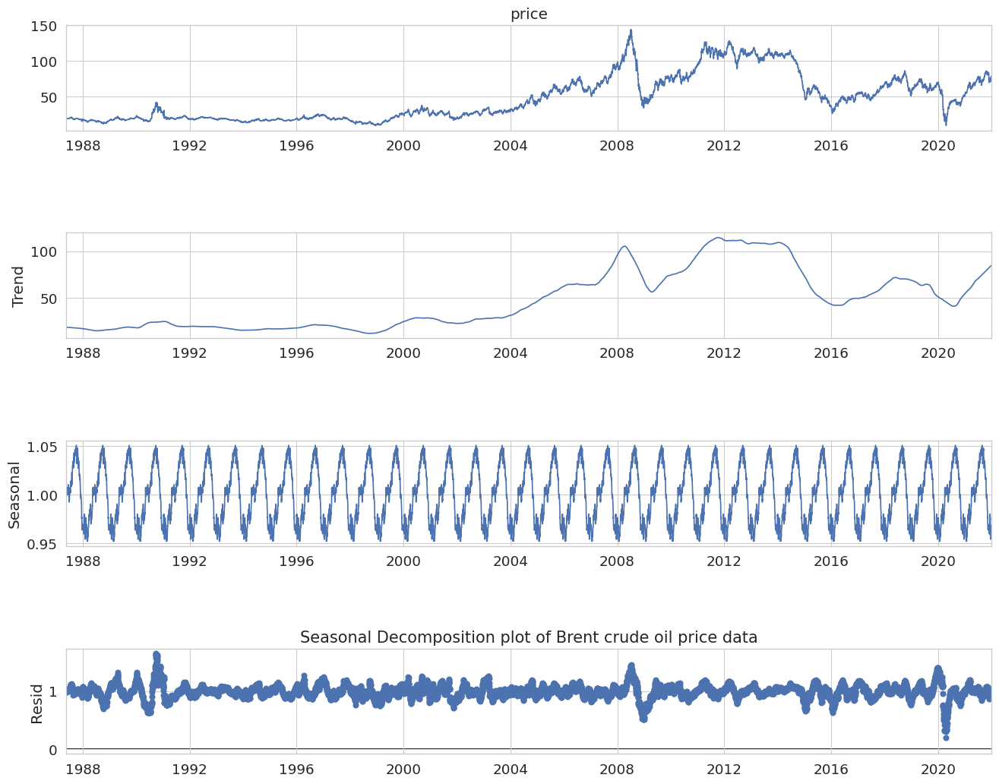

In [ ]:
# Plotting the seasonal decomposition

fig_b_hist_decomp = b_sd_result.plot()
fig_b_hist_decomp.set_size_inches(15, 12) 
plt.title('Seasonal Decomposition plot of Brent crude oil price data', fontsize=15)

In [ ]:
# Hypothesis Testing for Stationarity using Dicky Fuller Test

sd_residue = adfuller(b_sd_result.resid)
b_sd_ans = 'stationary' if adfuller(b_sd_result.resid)[1] < 0.05 else 'not stationary'
print(sd_residue)
print('The residue is '+b_sd_ans+'.')

(-11.380763225050401, 8.522797110895683e-21, 34, 8754, {'1%': -3.431097226246283, '5%': -2.8618702243759544, '10%': -2.56694577346149}, -41687.15397472042)
The residue is stationary.


### 1) Auto-ARIMA

In [ ]:
# Model Creation using Auto-ARIMA
with StepwiseContext(max_dur=25):
  brent_auto_arima_model = auto_arima(y=brent_y_hist,
                                seasonal=True, 
                                stationary = False,                            
                                information_criterion="aic",
                                stepwise=True,
                                parallel=True,
                                trace=True,
                                m=22,
                                with_intercept = True,
                                random_state = 42,
                                n_jobs=3,start_p = 2,
                                max_p = 5,start_q = 0,
                                max_q = 2,
                                max_P = 1, max_Q = 1
                                )
brent_order = brent_auto_arima_model.get_params().get("order")

/usr/local/lib/python3.9/dist-packages/pmdarima/arima/_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


Performing stepwise search to minimize aic
 ARIMA(2,1,0)(1,0,1)[22] intercept   : AIC=26812.640, Time=10.50 sec
 ARIMA(0,1,0)(0,0,0)[22] intercept   : AIC=26812.211, Time=0.16 sec
 ARIMA(1,1,0)(1,0,0)[22] intercept   : AIC=26809.498, Time=5.55 sec
 ARIMA(0,1,1)(0,0,1)[22] intercept   : AIC=26809.377, Time=6.09 sec
 ARIMA(0,1,0)(0,0,0)[22]             : AIC=26810.527, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[22] intercept   : AIC=26807.783, Time=0.69 sec
 ARIMA(0,1,1)(1,0,0)[22] intercept   : AIC=26809.385, Time=6.83 sec
 ARIMA(0,1,1)(1,0,1)[22] intercept   : AIC=26811.289, Time=9.09 sec
 ARIMA(1,1,1)(0,0,0)[22] intercept   : AIC=26809.259, Time=0.80 sec
 ARIMA(0,1,2)(0,0,0)[22] intercept   : AIC=26809.203, Time=0.86 sec
 ARIMA(1,1,0)(0,0,0)[22] intercept   : AIC=26807.893, Time=0.50 sec
 ARIMA(1,1,2)(0,0,0)[22] intercept   : AIC=26811.607, Time=1.82 sec
 ARIMA(0,1,1)(0,0,0)[22]             : AIC=26806.082, Time=0.37 sec

Best model:  ARIMA(0,1,1)(0,0,0)[22]          
Total fit time: 43.504 s

/usr/local/lib/python3.9/dist-packages/pmdarima/arima/_auto_solvers.py:326: UserWarning: early termination of stepwise search due to max_dur threshold (43.412 > 25.000)
  warnings.warn('early termination of stepwise search due to '


In [ ]:
brent_cv_autoarima = model_selection.SlidingWindowForecastCV(h=22, 
                                                 step=(22),         #can also be considered as cycle of forecasting
                                                 window_size=(253*2)
                                                 )

brent_cv_score = model_selection.cross_val_score(estimator = brent_auto_arima_model,
                                           y = brent_y_hist,
                                           scoring = 'mean_squared_error',
                                           cv = brent_cv_autoarima,
                                           verbose = 2,
                                           error_score= 100000000000000000)


[CV] fold=0 ..........................................................
[CV] fold=1 ..........................................................
[CV] fold=2 ..........................................................
[CV] fold=3 ..........................................................
[CV] fold=4 ..........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=5 ..........................................................
[CV] fold=6 ..........................................................
[CV] fold=7 ..........................................................
[CV] fold=8 ..........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=9 ..........................................................
[CV] fold=10 .........................................................
[CV] fold=11 .........................................................
[CV] fold=12 .........................................................
[CV] fold=13 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=14 .........................................................
[CV] fold=15 .........................................................
[CV] fold=16 .........................................................
[CV] fold=17 .........................................................
[CV] fold=18 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=19 .........................................................
[CV] fold=20 .........................................................
[CV] fold=21 .........................................................
[CV] fold=22 .........................................................
[CV] fold=23 .........................................................
[CV] fold=24 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=25 .........................................................
[CV] fold=26 .........................................................
[CV] fold=27 .........................................................
[CV] fold=28 .........................................................
[CV] fold=29 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=30 .........................................................
[CV] fold=31 .........................................................
[CV] fold=32 .........................................................
[CV] fold=33 .........................................................
[CV] fold=34 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=35 .........................................................
[CV] fold=36 .........................................................
[CV] fold=37 .........................................................
[CV] fold=38 .........................................................
[CV] fold=39 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=40 .........................................................
[CV] fold=41 .........................................................
[CV] fold=42 .........................................................
[CV] fold=43 .........................................................
[CV] fold=44 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=45 .........................................................
[CV] fold=46 .........................................................
[CV] fold=47 .........................................................
[CV] fold=48 .........................................................
[CV] fold=49 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=50 .........................................................
[CV] fold=51 .........................................................
[CV] fold=52 .........................................................
[CV] fold=53 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=54 .........................................................
[CV] fold=55 .........................................................
[CV] fold=56 .........................................................
[CV] fold=57 .........................................................
[CV] fold=58 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=59 .........................................................
[CV] fold=60 .........................................................
[CV] fold=61 .........................................................
[CV] fold=62 .........................................................
[CV] fold=63 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=64 .........................................................
[CV] fold=65 .........................................................
[CV] fold=66 .........................................................
[CV] fold=67 .........................................................
[CV] fold=68 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=69 .........................................................
[CV] fold=70 .........................................................
[CV] fold=71 .........................................................
[CV] fold=72 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=73 .........................................................
[CV] fold=74 .........................................................
[CV] fold=75 .........................................................
[CV] fold=76 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=77 .........................................................
[CV] fold=78 .........................................................
[CV] fold=79 .........................................................
[CV] fold=80 .........................................................
[CV] fold=81 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=82 .........................................................
[CV] fold=83 .........................................................
[CV] fold=84 .........................................................
[CV] fold=85 .........................................................
[CV] fold=86 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=87 .........................................................
[CV] fold=88 .........................................................
[CV] fold=89 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=90 .........................................................
[CV] fold=91 .........................................................
[CV] fold=92 .........................................................
[CV] fold=93 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=94 .........................................................
[CV] fold=95 .........................................................
[CV] fold=96 .........................................................
[CV] fold=97 .........................................................
[CV] fold=98 .........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=99 .........................................................
[CV] fold=100 ........................................................
[CV] fold=101 ........................................................
[CV] fold=102 ........................................................
[CV] fold=103 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=104 ........................................................
[CV] fold=105 ........................................................
[CV] fold=106 ........................................................
[CV] fold=107 ........................................................
[CV] fold=108 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=109 ........................................................
[CV] fold=110 ........................................................
[CV] fold=111 ........................................................
[CV] fold=112 ........................................................
[CV] fold=113 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=114 ........................................................
[CV] fold=115 ........................................................
[CV] fold=116 ........................................................
[CV] fold=117 ........................................................
[CV] fold=118 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=119 ........................................................
[CV] fold=120 ........................................................
[CV] fold=121 ........................................................
[CV] fold=122 ........................................................
[CV] fold=123 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=124 ........................................................
[CV] fold=125 ........................................................
[CV] fold=126 ........................................................
[CV] fold=127 ........................................................
[CV] fold=128 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=129 ........................................................
[CV] fold=130 ........................................................
[CV] fold=131 ........................................................
[CV] fold=132 ........................................................
[CV] fold=133 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=134 ........................................................
[CV] fold=135 ........................................................
[CV] fold=136 ........................................................
[CV] fold=137 ........................................................
[CV] fold=138 ........................................................
[CV] fold=139 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=140 ........................................................
[CV] fold=141 ........................................................
[CV] fold=142 ........................................................
[CV] fold=143 ........................................................
[CV] fold=144 ........................................................
[CV] fold=145 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=146 ........................................................
[CV] fold=147 ........................................................
[CV] fold=148 ........................................................
[CV] fold=149 ........................................................
[CV] fold=150 ........................................................
[CV] fold=151 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=152 ........................................................
[CV] fold=153 ........................................................
[CV] fold=154 ........................................................
[CV] fold=155 ........................................................
[CV] fold=156 ........................................................
[CV] fold=157 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=158 ........................................................
[CV] fold=159 ........................................................
[CV] fold=160 ........................................................
[CV] fold=161 ........................................................
[CV] fold=162 ........................................................
[CV] fold=163 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=164 ........................................................
[CV] fold=165 ........................................................
[CV] fold=166 ........................................................
[CV] fold=167 ........................................................
[CV] fold=168 ........................................................
[CV] fold=169 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=170 ........................................................
[CV] fold=171 ........................................................
[CV] fold=172 ........................................................
[CV] fold=173 ........................................................
[CV] fold=174 ........................................................
[CV] fold=175 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=176 ........................................................
[CV] fold=177 ........................................................
[CV] fold=178 ........................................................
[CV] fold=179 ........................................................
[CV] fold=180 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


[CV] fold=181 ........................................................
[CV] fold=182 ........................................................
[CV] fold=183 ........................................................
[CV] fold=184 ........................................................
[CV] fold=185 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=186 ........................................................
[CV] fold=187 ........................................................
[CV] fold=188 ........................................................
[CV] fold=189 ........................................................
[CV] fold=190 ........................................................
[CV] fold=191 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=192 ........................................................
[CV] fold=193 ........................................................
[CV] fold=194 ........................................................
[CV] fold=195 ........................................................
[CV] fold=196 ........................................................
[CV] fold=197 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=198 ........................................................
[CV] fold=199 ........................................................
[CV] fold=200 ........................................................
[CV] fold=201 ........................................................
[CV] fold=202 ........................................................
[CV] fold=203 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=204 ........................................................
[CV] fold=205 ........................................................
[CV] fold=206 ........................................................
[CV] fold=207 ........................................................
[CV] fold=208 ........................................................
[CV] fold=209 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=210 ........................................................
[CV] fold=211 ........................................................
[CV] fold=212 ........................................................
[CV] fold=213 ........................................................
[CV] fold=214 ........................................................
[CV] fold=215 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=216 ........................................................
[CV] fold=217 ........................................................
[CV] fold=218 ........................................................
[CV] fold=219 ........................................................
[CV] fold=220 ........................................................
[CV] fold=221 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=222 ........................................................
[CV] fold=223 ........................................................
[CV] fold=224 ........................................................
[CV] fold=225 ........................................................
[CV] fold=226 ........................................................
[CV] fold=227 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=228 ........................................................
[CV] fold=229 ........................................................
[CV] fold=230 ........................................................
[CV] fold=231 ........................................................
[CV] fold=232 ........................................................
[CV] fold=233 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=234 ........................................................
[CV] fold=235 ........................................................
[CV] fold=236 ........................................................
[CV] fold=237 ........................................................
[CV] fold=238 ........................................................
[CV] fold=239 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=240 ........................................................
[CV] fold=241 ........................................................
[CV] fold=242 ........................................................
[CV] fold=243 ........................................................
[CV] fold=244 ........................................................
[CV] fold=245 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=246 ........................................................
[CV] fold=247 ........................................................
[CV] fold=248 ........................................................
[CV] fold=249 ........................................................
[CV] fold=250 ........................................................
[CV] fold=251 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=252 ........................................................
[CV] fold=253 ........................................................
[CV] fold=254 ........................................................
[CV] fold=255 ........................................................
[CV] fold=256 ........................................................
[CV] fold=257 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=258 ........................................................
[CV] fold=259 ........................................................
[CV] fold=260 ........................................................
[CV] fold=261 ........................................................
[CV] fold=262 ........................................................
[CV] fold=263 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=264 ........................................................
[CV] fold=265 ........................................................
[CV] fold=266 ........................................................
[CV] fold=267 ........................................................
[CV] fold=268 ........................................................
[CV] fold=269 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=270 ........................................................
[CV] fold=271 ........................................................
[CV] fold=272 ........................................................
[CV] fold=273 ........................................................
[CV] fold=274 ........................................................
[CV] fold=275 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=276 ........................................................
[CV] fold=277 ........................................................
[CV] fold=278 ........................................................
[CV] fold=279 ........................................................
[CV] fold=280 ........................................................
[CV] fold=281 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=282 ........................................................
[CV] fold=283 ........................................................
[CV] fold=284 ........................................................
[CV] fold=285 ........................................................
[CV] fold=286 ........................................................
[CV] fold=287 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=288 ........................................................
[CV] fold=289 ........................................................
[CV] fold=290 ........................................................
[CV] fold=291 ........................................................
[CV] fold=292 ........................................................
[CV] fold=293 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=294 ........................................................
[CV] fold=295 ........................................................
[CV] fold=296 ........................................................
[CV] fold=297 ........................................................
[CV] fold=298 ........................................................
[CV] fold=299 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=300 ........................................................
[CV] fold=301 ........................................................
[CV] fold=302 ........................................................
[CV] fold=303 ........................................................
[CV] fold=304 ........................................................
[CV] fold=305 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=306 ........................................................
[CV] fold=307 ........................................................
[CV] fold=308 ........................................................
[CV] fold=309 ........................................................
[CV] fold=310 ........................................................
[CV] fold=311 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=312 ........................................................
[CV] fold=313 ........................................................
[CV] fold=314 ........................................................
[CV] fold=315 ........................................................
[CV] fold=316 ........................................................
[CV] fold=317 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=318 ........................................................
[CV] fold=319 ........................................................
[CV] fold=320 ........................................................
[CV] fold=321 ........................................................
[CV] fold=322 ........................................................
[CV] fold=323 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=324 ........................................................
[CV] fold=325 ........................................................
[CV] fold=326 ........................................................
[CV] fold=327 ........................................................
[CV] fold=328 ........................................................
[CV] fold=329 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=330 ........................................................
[CV] fold=331 ........................................................
[CV] fold=332 ........................................................
[CV] fold=333 ........................................................
[CV] fold=334 ........................................................
[CV] fold=335 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=336 ........................................................
[CV] fold=337 ........................................................
[CV] fold=338 ........................................................
[CV] fold=339 ........................................................
[CV] fold=340 ........................................................
[CV] fold=341 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=342 ........................................................
[CV] fold=343 ........................................................
[CV] fold=344 ........................................................
[CV] fold=345 ........................................................
[CV] fold=346 ........................................................
[CV] fold=347 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=348 ........................................................
[CV] fold=349 ........................................................
[CV] fold=350 ........................................................
[CV] fold=351 ........................................................
[CV] fold=352 ........................................................
[CV] fold=353 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=354 ........................................................
[CV] fold=355 ........................................................
[CV] fold=356 ........................................................
[CV] fold=357 ........................................................
[CV] fold=358 ........................................................
[CV] fold=359 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=360 ........................................................
[CV] fold=361 ........................................................
[CV] fold=362 ........................................................
[CV] fold=363 ........................................................
[CV] fold=364 ........................................................
[CV] fold=365 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

[CV] fold=366 ........................................................
[CV] fold=367 ........................................................
[CV] fold=368 ........................................................
[CV] fold=369 ........................................................
[CV] fold=370 ........................................................
[CV] fold=371 ........................................................
[CV] fold=372 ........................................................
[CV] fold=373 ........................................................
[CV] fold=374 ........................................................
[CV] fold=375 ........................................................


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_mode

In [ ]:
# Making predictions on the training data

brent_df_series = brent_df.squeeze()
date_index = brent_df_series.index
cv_generator = brent_cv_autoarima.split(brent_df_series.index) # generates indices splits according to the sliding window
brent_preds_df = []

for train,test in cv_generator:
  brent_auto_arima_model.fit(brent_df_series.take(train))
  temp_brent_pred_df = pd.DataFrame(index=date_index[test])
  temp1 = brent_auto_arima_model.predict(n_periods=len(test))
  temp_brent_pred_df['Predictions']=temp1.values
  temp_brent_pred_df['Price']=brent_df_series[test].values
  # print(temp_brent_pred_df)
  brent_preds_df.append(temp_brent_pred_df)

In [ ]:
brent_preds_df

[            Predictions  Price
 Date                          
 1989-05-15    19.193945  19.20
 1989-05-16    19.193945  19.80
 1989-05-17    19.193945  18.58
 1989-05-18    19.193945  18.60
 1989-05-19    19.193945  18.30
 1989-05-22    19.193945  17.40
 1989-05-23    19.193945  17.70
 1989-05-24    19.193945  18.15
 1989-05-25    19.193945  18.20
 1989-05-26    19.193945  17.65
 1989-05-29    19.193945  17.73
 1989-05-30    19.193945  18.03
 1989-05-31    19.193945  18.25
 1989-06-01    19.193945  18.08
 1989-06-02    19.193945  18.15
 1989-06-05    19.193945  18.55
 1989-06-06    19.193945  18.50
 1989-06-07    19.193945  18.15
 1989-06-08    19.193945  17.80
 1989-06-09    19.193945  17.95
 1989-06-12    19.193945  17.18
 1989-06-13    19.193945  16.80,
             Predictions  Price
 Date                          
 1989-06-14    16.786059  16.90
 1989-06-15    16.786059  16.95
 1989-06-16    16.786059  16.65
 1989-06-19    16.786059  16.85
 1989-06-20    16.786059  16.88
 1989-0

# Making Forecast with the Model

## Cushing data

### 0) Seasonal Decomposition

In [ ]:
# length of the forecast test period
f = len(cushing_y_future)
f

289

In [ ]:
cushing_y_forecast = c_sd_result.trend
cushing_y_forecast = cushing_y_forecast.append(cushing_y_future)
cushing_y_forecast[-f:] = np.NaN
cushing_y_forecast.interpolate(method='linear',inplace=True)
cushing_y_forecast = cushing_y_forecast[-f:]

In [ ]:
cushing_y_forecast

Date
2022-01-03    82.592609
2022-01-04    82.592609
2022-01-05    82.592609
2022-01-06    82.592609
2022-01-07    82.592609
                ...    
2023-02-21    82.592609
2023-02-22    82.592609
2023-02-23    82.592609
2023-02-24    82.592609
2023-02-27    82.592609
Length: 289, dtype: float64

In [ ]:
cushing_y_forecast.index

DatetimeIndex(['2022-01-03', '2022-01-04', '2022-01-05', '2022-01-06',
               '2022-01-07', '2022-01-10', '2022-01-11', '2022-01-12',
               '2022-01-13', '2022-01-14',
               ...
               '2023-02-13', '2023-02-14', '2023-02-15', '2023-02-16',
               '2023-02-17', '2023-02-21', '2023-02-22', '2023-02-23',
               '2023-02-24', '2023-02-27'],
              dtype='datetime64[ns]', name='Date', length=289, freq=None)

In [ ]:
cushing_y_hist.index[-753:-753+289]

DatetimeIndex(['2018-12-28', '2019-01-02', '2019-01-03', '2019-01-04',
               '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10',
               '2019-01-11', '2019-01-14',
               ...
               '2020-02-12', '2020-02-13', '2020-02-14', '2020-02-18',
               '2020-02-19', '2020-02-20', '2020-02-21', '2020-02-24',
               '2020-02-25', '2020-02-26'],
              dtype='datetime64[ns]', name='Date', length=289, freq=None)

In [ ]:
# Calculating the forecast
cushing_y_forecast = cushing_y_forecast * c_sd_result.seasonal[-753:-753+289].values

In [ ]:
# Index of the forecast test period
cushing_y_forecast.index

DatetimeIndex(['2022-01-03', '2022-01-04', '2022-01-05', '2022-01-06',
               '2022-01-07', '2022-01-10', '2022-01-11', '2022-01-12',
               '2022-01-13', '2022-01-14',
               ...
               '2023-02-13', '2023-02-14', '2023-02-15', '2023-02-16',
               '2023-02-17', '2023-02-21', '2023-02-22', '2023-02-23',
               '2023-02-24', '2023-02-27'],
              dtype='datetime64[ns]', name='Date', length=289, freq=None)

In [ ]:
# Forecasted values by seasonal decompositions method
cushing_y_forecast

Date
2022-01-03    81.907626
2022-01-04    81.692290
2022-01-05    81.362231
2022-01-06    81.111693
2022-01-07    81.407741
                ...    
2023-02-21    81.336149
2023-02-22    81.141255
2023-02-23    81.224587
2023-02-24    81.105351
2023-02-27    81.132135
Length: 289, dtype: float64

In [ ]:
cushing_y_forecast_df = cushing_y_forecast.to_frame()
cushing_y_forecast_df.rename(columns={0:'predicted_price'},inplace=True)
cushing_y_forecast_df['price'] = cushing_y_future
cushing_y_forecast_df.to_csv('/content/drive/MyDrive/PCDS_OilPricePrediction/forecasting_products/seasonal_decomposition_arima/cushing_predictions.csv')

In [ ]:
seasonal_decompose_metrics_df = {}
seasonal_decompose_metrics_df['cushing_forecast_rmse'] = mean_squared_error(cushing_y_forecast_df['price'],cushing_y_forecast_df['predicted_price'],squared=False)
seasonal_decompose_metrics_df['cushing_forecast_mse'] = mean_squared_error(cushing_y_forecast_df['price'],cushing_y_forecast_df['predicted_price'],squared=True)

(array([ 5113.,  6574.,  8035.,  9496., 10957., 12418., 13879., 15340.,
        16801., 18262., 19723., 21184.]),
 [Text(5113.0, 0, '1984'),
  Text(6574.0, 0, '1988'),
  Text(8035.0, 0, '1992'),
  Text(9496.0, 0, '1996'),
  Text(10957.0, 0, '2000'),
  Text(12418.0, 0, '2004'),
  Text(13879.0, 0, '2008'),
  Text(15340.0, 0, '2012'),
  Text(16801.0, 0, '2016'),
  Text(18262.0, 0, '2020'),
  Text(19723.0, 0, '2024'),
  Text(21184.0, 0, '2028')])

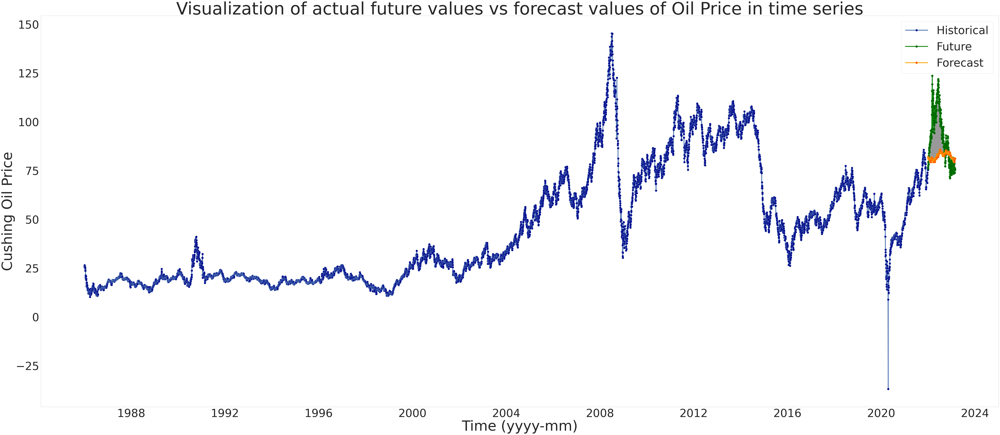

In [ ]:
# Ploting the forecast vs Actual values
fig = plt.figure(figsize=(85,35))
ax = fig.add_subplot() # nrows, ncols, index

plt.plot(cushing_y_hist,    
         markersize=20,linewidth=4,
         markerfacecolor= 'darkblue',
         marker='.',label='Historical')

plt.plot(cushing_y_future,    
         markersize=20,linewidth=4,
         markerfacecolor= 'darkgreen',
         marker='.',
        color='green',label='Future')

plt.plot(cushing_y_forecast,    
         markersize=20,linewidth=4,
         markerfacecolor= 'orangered',
         marker='.',
        color='orange',label='Forecast')

plt.fill_between(cushing_y_forecast.index, cushing_y_forecast, cushing_y_future,color=(0.6,0.6,0.6))
plt.legend(fontsize=55)
plt.grid()
plt.xlabel('Time (yyyy-mm)', fontsize= 70)
plt.ylabel('Cushing Oil Price', fontsize= 70)
plt.title('Visualization of actual future values vs forecast values of Oil Price in time series', fontsize=85)
plt.yticks(fontsize=55)
plt.xticks(fontsize=55)
# plt.savefig('ts_forecast.png')

(array([18993., 19052., 19113., 19174., 19236., 19297., 19358., 19417.]),
 [Text(18993.0, 0, '2022-01'),
  Text(19052.0, 0, '2022-03'),
  Text(19113.0, 0, '2022-05'),
  Text(19174.0, 0, '2022-07'),
  Text(19236.0, 0, '2022-09'),
  Text(19297.0, 0, '2022-11'),
  Text(19358.0, 0, '2023-01'),
  Text(19417.0, 0, '2023-03')])

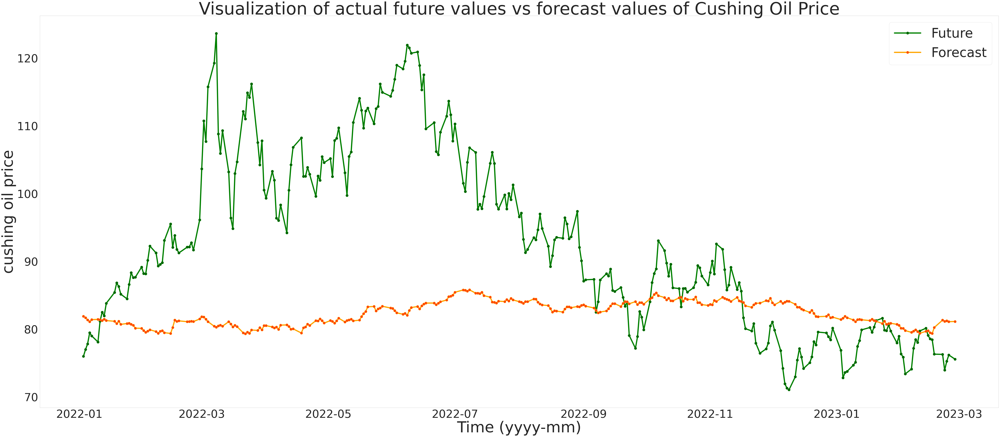

In [ ]:
# Visualisation of future value (development data) vs forecast value
fig = plt.figure(figsize=(85,35))
ax = fig.add_subplot()

plt.plot(cushing_y_future,    
         markersize=25,linewidth=6,
         markerfacecolor= 'darkgreen',
         marker='.',
        color='green',label='Future')

plt.plot(cushing_y_forecast,    
         markersize=25,linewidth=6,
         markerfacecolor= 'orangered',
         marker='.',
        color='orange',label='Forecast')

#plt.fill_between(y_forecast.index, y_forecast, y_future,color=(0.6,0.6,0.6))
plt.legend(fontsize=65)
plt.grid()
plt.xlabel('Time (yyyy-mm)', fontsize= 75)
plt.ylabel('cushing oil price', fontsize= 75)
plt.title('Visualization of actual future values vs forecast values of Cushing Oil Price', fontsize=85)
plt.yticks(fontsize=55)
plt.xticks(fontsize=55)
# plt.savefig('forecast_future.png')

### 1) Auto-Arima

In [ ]:
# Error calclulation on cross validated development set

error_auto_arima = np.sqrt(np.average(cv_score))

In [ ]:
error_auto_arima

4.186461279074983

In [ ]:
# get predictions on the test data(future data)
cushing_y_forecast_auto_arima = pd.DataFrame(index=cushing_y_future.index)
temp1 = cushing_auto_arima_model.predict(n_periods=289)
cushing_y_forecast_auto_arima['predicted_price']=temp1.values
cushing_y_forecast_auto_arima['price'] = cushing_y_future
cushing_y_forecast_auto_arima.to_csv('/content/drive/MyDrive/PCDS_OilPricePrediction/forecasting_products/seasonal_decomposition_arima/cushing_auto_arima_predictions.csv')

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


(array([18993., 19052., 19113., 19174., 19236., 19297., 19358., 19417.]),
 [Text(18993.0, 0, '2022-01'),
  Text(19052.0, 0, '2022-03'),
  Text(19113.0, 0, '2022-05'),
  Text(19174.0, 0, '2022-07'),
  Text(19236.0, 0, '2022-09'),
  Text(19297.0, 0, '2022-11'),
  Text(19358.0, 0, '2023-01'),
  Text(19417.0, 0, '2023-03')])

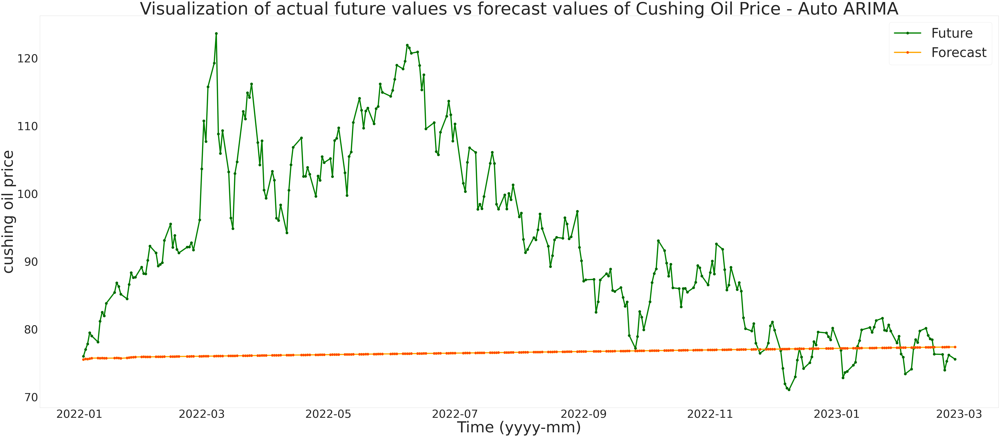

In [ ]:
# Visualisation of future value (development data) vs forecast value
fig = plt.figure(figsize=(85,35))
ax = fig.add_subplot()

plt.plot(cushing_y_future,    
         markersize=25,linewidth=6,
         markerfacecolor= 'darkgreen',
         marker='.',
        color='green',label='Future')

plt.plot(cushing_y_forecast_auto_arima,    
         markersize=25,linewidth=6,
         markerfacecolor= 'orangered',
         marker='.',
        color='orange',label='Forecast')

#plt.fill_between(y_forecast.index, y_forecast, y_future,color=(0.6,0.6,0.6))
plt.legend(fontsize=65)
plt.grid()
plt.xlabel('Time (yyyy-mm)', fontsize= 75)
plt.ylabel('cushing oil price', fontsize= 75)
plt.title('Visualization of actual future values vs forecast values of Cushing Oil Price - Auto ARIMA', fontsize=85)
plt.yticks(fontsize=55)
plt.xticks(fontsize=55)
# plt.savefig('forecast_future.png')

In [ ]:
auto_arima_metrics_df = {}
auto_arima_metrics_df['cushing_forecast_rmse'] = mean_squared_error(cushing_y_forecast_auto_arima['price'],cushing_y_forecast_auto_arima['predicted_price'],squared=False)
auto_arima_metrics_df['cushing_forecast_mse'] = mean_squared_error(cushing_y_forecast_auto_arima['price'],cushing_y_forecast_auto_arima['predicted_price'],squared=True)

Text(0.5, 1.0, 'WTI crude oil price prediction using ARIMA for 22 days.')

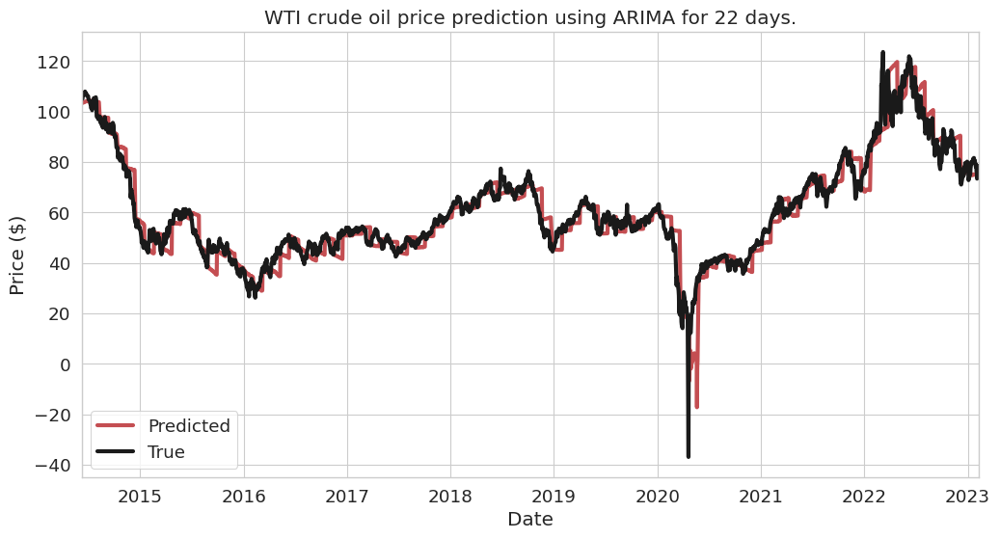

In [ ]:
## Visualization of the CV SARIMA model prediction on the training data, development and test data

pd.concat(preds_df[303:]).plot(figsize=(12,6),lw=3,color=['r','k'])
plt.legend(('Predicted','True'))
plt.ylabel('Price ($)')
plt.title(f'WTI crude oil price prediction using ARIMA for 22 days.')

In [ ]:
pd.concat(preds_df).to_csv('/content/drive/MyDrive/PCDS_OilPricePrediction/forecasting_products/seasonal_decomposition_arima/cushing_cv_predictions.csv')

In [ ]:
cushing_cv_rmse = []
cushing_cv_mse = []
for df in preds_df:
  cushing_cv_rmse.append(mean_squared_error(df['Price'],df['Predictions'],squared=False))
  cushing_cv_mse.append(mean_squared_error(df['Price'],df['Predictions'],squared=True))

## Brent data

### 0) Seasonal Decomposition

In [ ]:
# length of the forecast test period
f = len(brent_y_future)
f

292

In [ ]:
brent_y_forecast = b_sd_result.trend
brent_y_forecast = brent_y_forecast.append(brent_y_future)
brent_y_forecast[-f:] = np.NaN
brent_y_forecast.interpolate(method='linear',inplace=True)
brent_y_forecast = brent_y_forecast[-f:]

In [ ]:
brent_y_forecast

Date
2022-01-03    84.742569
2022-01-04    84.742569
2022-01-05    84.742569
2022-01-06    84.742569
2022-01-07    84.742569
                ...    
2023-02-21    84.742569
2023-02-22    84.742569
2023-02-23    84.742569
2023-02-24    84.742569
2023-02-27    84.742569
Length: 292, dtype: float64

In [ ]:
brent_y_forecast.index

DatetimeIndex(['2022-01-03', '2022-01-04', '2022-01-05', '2022-01-06',
               '2022-01-07', '2022-01-10', '2022-01-11', '2022-01-12',
               '2022-01-13', '2022-01-14',
               ...
               '2023-02-14', '2023-02-15', '2023-02-16', '2023-02-17',
               '2023-02-20', '2023-02-21', '2023-02-22', '2023-02-23',
               '2023-02-24', '2023-02-27'],
              dtype='datetime64[ns]', name='Date', length=292, freq=None)

In [ ]:
brent_y_hist.index[-765:-765+292]

DatetimeIndex(['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07',
               '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11',
               '2019-01-14', '2019-01-15',
               ...
               '2020-02-06', '2020-02-07', '2020-02-10', '2020-02-11',
               '2020-02-12', '2020-02-13', '2020-02-14', '2020-02-17',
               '2020-02-18', '2020-02-19'],
              dtype='datetime64[ns]', name='Date', length=292, freq=None)

In [ ]:
# Calculating the forecast
brent_y_forecast = brent_y_forecast * b_sd_result.seasonal[-765:-765+292].values

In [ ]:
# Index of the forecast test period
brent_y_forecast.index

DatetimeIndex(['2022-01-03', '2022-01-04', '2022-01-05', '2022-01-06',
               '2022-01-07', '2022-01-10', '2022-01-11', '2022-01-12',
               '2022-01-13', '2022-01-14',
               ...
               '2023-02-14', '2023-02-15', '2023-02-16', '2023-02-17',
               '2023-02-20', '2023-02-21', '2023-02-22', '2023-02-23',
               '2023-02-24', '2023-02-27'],
              dtype='datetime64[ns]', name='Date', length=292, freq=None)

In [ ]:
# Forecasted values by seasonal decompositions method
brent_y_forecast

Date
2022-01-03    81.137581
2022-01-04    80.915477
2022-01-05    80.962924
2022-01-06    81.284418
2022-01-07    81.356913
                ...    
2023-02-21    82.419934
2023-02-22    82.970011
2023-02-23    82.697692
2023-02-24    82.522577
2023-02-27    82.673803
Length: 292, dtype: float64

In [ ]:
brent_y_forecast_df = brent_y_forecast.to_frame()
brent_y_forecast_df.rename(columns={0:'predicted_price'},inplace=True)
brent_y_forecast_df['price'] = brent_y_future
brent_y_forecast_df.to_csv('/content/drive/MyDrive/PCDS_OilPricePrediction/forecasting_products/seasonal_decomposition_arima/brent_predictions.csv')

In [ ]:
seasonal_decompose_metrics_df['brent_forecast_rmse'] = mean_squared_error(brent_y_forecast_df['price'],brent_y_forecast_df['predicted_price'],squared=False)
seasonal_decompose_metrics_df['brent_forecast_mse'] = mean_squared_error(brent_y_forecast_df['price'],brent_y_forecast_df['predicted_price'],squared=True)
seasonal_decompose_metrics_df = pd.DataFrame.from_dict(seasonal_decompose_metrics_df,orient='index')
seasonal_decompose_metrics_df.rename(columns={0:'metric values'},inplace=True)
seasonal_decompose_metrics_df.to_csv('/content/drive/MyDrive/PCDS_OilPricePrediction/forecasting_products/seasonal_decomposition_arima/arima_seasonal_decompose_metrics.csv')
seasonal_decompose_metrics_df

,metric values
cushing_forecast_rmse,16.687030
cushing_forecast_mse,278.456961
brent_forecast_rmse,19.371349
brent_forecast_mse,375.249145


(array([ 5113.,  6574.,  8035.,  9496., 10957., 12418., 13879., 15340.,
        16801., 18262., 19723.]),
 [Text(5113.0, 0, '1984'),
  Text(6574.0, 0, '1988'),
  Text(8035.0, 0, '1992'),
  Text(9496.0, 0, '1996'),
  Text(10957.0, 0, '2000'),
  Text(12418.0, 0, '2004'),
  Text(13879.0, 0, '2008'),
  Text(15340.0, 0, '2012'),
  Text(16801.0, 0, '2016'),
  Text(18262.0, 0, '2020'),
  Text(19723.0, 0, '2024')])

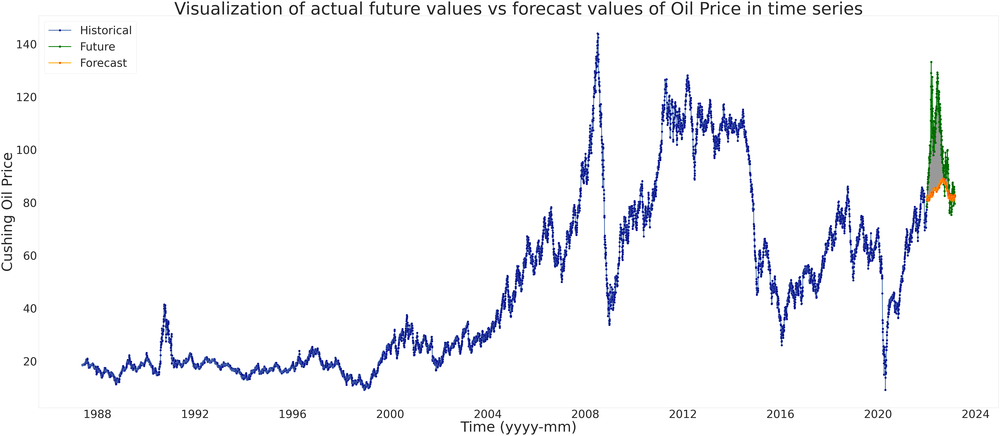

In [ ]:
# Ploting the forecast vs Actual values
fig = plt.figure(figsize=(85,35))
ax = fig.add_subplot() # nrows, ncols, index

plt.plot(brent_y_hist,    
         markersize=20,linewidth=4,
         markerfacecolor= 'darkblue',
         marker='.',label='Historical')

plt.plot(brent_y_future,    
         markersize=20,linewidth=4,
         markerfacecolor= 'darkgreen',
         marker='.',
        color='green',label='Future')

plt.plot(brent_y_forecast,    
         markersize=20,linewidth=4,
         markerfacecolor= 'orangered',
         marker='.',
        color='orange',label='Forecast')

plt.fill_between(brent_y_forecast.index, brent_y_forecast, brent_y_future,color=(0.6,0.6,0.6))
plt.legend(fontsize=55)
plt.grid()
plt.xlabel('Time (yyyy-mm)', fontsize= 70)
plt.ylabel('Cushing Oil Price', fontsize= 70)
plt.title('Visualization of actual future values vs forecast values of Oil Price in time series', fontsize=85)
plt.yticks(fontsize=55)
plt.xticks(fontsize=55)
# plt.savefig('ts_forecast.png')

(array([18993., 19052., 19113., 19174., 19236., 19297., 19358., 19417.]),
 [Text(18993.0, 0, '2022-01'),
  Text(19052.0, 0, '2022-03'),
  Text(19113.0, 0, '2022-05'),
  Text(19174.0, 0, '2022-07'),
  Text(19236.0, 0, '2022-09'),
  Text(19297.0, 0, '2022-11'),
  Text(19358.0, 0, '2023-01'),
  Text(19417.0, 0, '2023-03')])

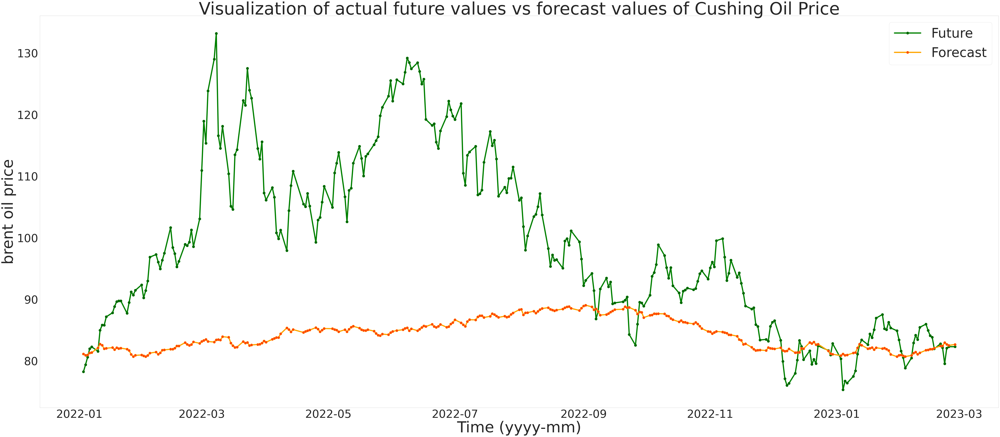

In [ ]:
# Visualisation of future value (development data) vs forecast value
fig = plt.figure(figsize=(85,35))
ax = fig.add_subplot()

plt.plot(brent_y_future,    
         markersize=25,linewidth=6,
         markerfacecolor= 'darkgreen',
         marker='.',
        color='green',label='Future')

plt.plot(brent_y_forecast,    
         markersize=25,linewidth=6,
         markerfacecolor= 'orangered',
         marker='.',
        color='orange',label='Forecast')

#plt.fill_between(y_forecast.index, y_forecast, y_future,color=(0.6,0.6,0.6))
plt.legend(fontsize=65)
plt.grid()
plt.xlabel('Time (yyyy-mm)', fontsize= 75)
plt.ylabel('brent oil price', fontsize= 75)
plt.title('Visualization of actual future values vs forecast values of Cushing Oil Price', fontsize=85)
plt.yticks(fontsize=55)
plt.xticks(fontsize=55)
# plt.savefig('forecast_future.png')

### 1) Auto-Arima

In [ ]:
# Error calclulation on cross validated development set
brent_error_auto_arima = np.sqrt(np.average(brent_cv_score))

In [ ]:
brent_error_auto_arima

4.194728283016214

In [ ]:
# get predictions on the test data(future data)
brent_y_forecast_auto_arima = pd.DataFrame(index=brent_y_future.index)
temp1 = brent_auto_arima_model.predict(n_periods=292)
brent_y_forecast_auto_arima['predicted_price']=temp1.values
brent_y_forecast_auto_arima['price'] = brent_y_future
brent_y_forecast_auto_arima.to_csv('/content/drive/MyDrive/PCDS_OilPricePrediction/forecasting_products/seasonal_decomposition_arima/brent_auto_arima_predictions.csv')

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


(array([18993., 19052., 19113., 19174., 19236., 19297., 19358., 19417.]),
 [Text(18993.0, 0, '2022-01'),
  Text(19052.0, 0, '2022-03'),
  Text(19113.0, 0, '2022-05'),
  Text(19174.0, 0, '2022-07'),
  Text(19236.0, 0, '2022-09'),
  Text(19297.0, 0, '2022-11'),
  Text(19358.0, 0, '2023-01'),
  Text(19417.0, 0, '2023-03')])

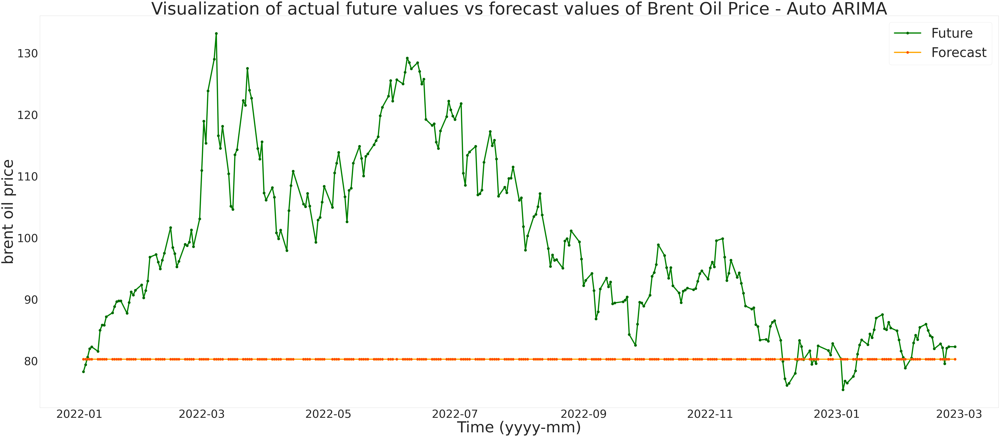

In [ ]:
# Visualisation of future value (development data) vs forecast value
fig = plt.figure(figsize=(85,35))
ax = fig.add_subplot()

plt.plot(brent_y_future,    
         markersize=25,linewidth=6,
         markerfacecolor= 'darkgreen',
         marker='.',
        color='green',label='Future')

plt.plot(brent_y_forecast_auto_arima['predicted_price'],    
         markersize=25,linewidth=6,
         markerfacecolor= 'orangered',
         marker='.',
        color='orange',label='Forecast')

#plt.fill_between(y_forecast.index, y_forecast, y_future,color=(0.6,0.6,0.6))
plt.legend(fontsize=65)
plt.grid()
plt.xlabel('Time (yyyy-mm)', fontsize= 75)
plt.ylabel('brent oil price', fontsize= 75)
plt.title('Visualization of actual future values vs forecast values of Brent Oil Price - Auto ARIMA', fontsize=85)
plt.yticks(fontsize=55)
plt.xticks(fontsize=55)
# plt.savefig('forecast_future.png')

In [ ]:
auto_arima_metrics_df['brent_forecast_rmse'] = mean_squared_error(brent_y_forecast_auto_arima['price'],brent_y_forecast_auto_arima['predicted_price'],squared=False)
auto_arima_metrics_df['brent_forecast_mse'] = mean_squared_error(brent_y_forecast_auto_arima['price'],brent_y_forecast_auto_arima['predicted_price'],squared=True)
auto_arima_metrics_df = pd.DataFrame.from_dict(auto_arima_metrics_df,orient='index')
auto_arima_metrics_df.rename(columns={0:'metric values'},inplace=True)
auto_arima_metrics_df.to_csv('/content/drive/MyDrive/PCDS_OilPricePrediction/forecasting_products/seasonal_decomposition_arima/auto_arima_decompose_metrics.csv')
auto_arima_metrics_df

,metric values
cushing_forecast_rmse,21.140382
cushing_forecast_mse,446.915759
brent_forecast_rmse,22.924131
brent_forecast_mse,525.515779


Text(0.5, 1.0, 'Brent crude oil price prediction using ARIMA for 22 days.')

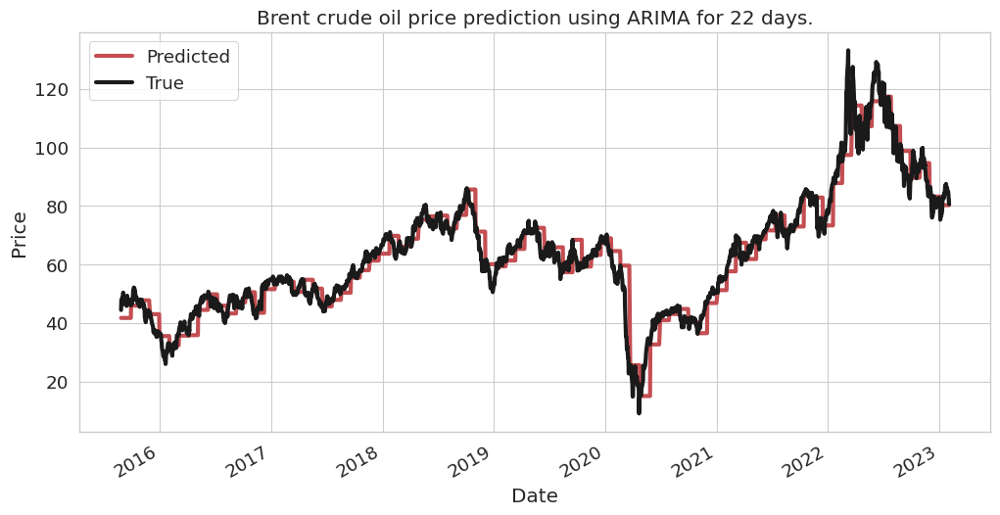

In [ ]:
## Visualization of the CV SARIMA model prediction on the training data, development and test data

pd.concat(brent_preds_df[303:]).plot(figsize=(12,6),lw=3,color=['r','k'])
plt.legend(('Predicted','True'))
plt.ylabel('Price')
plt.title(f'Brent crude oil price prediction using ARIMA for 22 days.')

In [ ]:
pd.concat(brent_preds_df).to_csv('/content/drive/MyDrive/PCDS_OilPricePrediction/forecasting_products/seasonal_decomposition_arima/brent_cv_predictions.csv')

In [ ]:
brent_cv_rmse = []
brent_cv_mse = []
for df in brent_preds_df:
  brent_cv_rmse.append(mean_squared_error(df['Price'],df['Predictions'],squared=False))
  brent_cv_mse.append(mean_squared_error(df['Price'],df['Predictions'],squared=True))

In [ ]:
cushing_cv_metrics_df = {}
brent_cv_metrics_df = {}
brent_cv_metrics_df['brent_cv_forecast_rmse'] = brent_cv_rmse
brent_cv_metrics_df['brent_cv_forecast_mse'] = brent_cv_mse
cushing_cv_metrics_df['cushing_cv_forecast_rmse'] = cushing_cv_rmse
cushing_cv_metrics_df['cushing_cv_forecast_mse'] = cushing_cv_mse
brent_cv_metrics_df = pd.DataFrame.from_dict(brent_cv_metrics_df,orient='index')
cushing_cv_metrics_df = pd.DataFrame.from_dict(cushing_cv_metrics_df,orient='index')
brent_cv_metrics_df.to_csv('/content/drive/MyDrive/PCDS_OilPricePrediction/forecasting_products/seasonal_decomposition_arima/brent_auto_arima_cv_metrics.csv')
cushing_cv_metrics_df.to_csv('/content/drive/MyDrive/PCDS_OilPricePrediction/forecasting_products/seasonal_decomposition_arima/cushing_auto_arima_cv_metrics.csv')

In [ ]:
brent_cv_metrics_df

,0,1,2,3,4,5,6,7,8,9,...,379,380,381,382,383,384,385,386,387,388
brent_cv_forecast_rmse,1.239334,1.131717,0.993568,0.608767,0.592278,0.663737,0.509899,1.732285,0.643027,1.292426,...,9.204866,4.979776,8.314826,6.337405,7.221323,8.841969,4.152792,5.770262,3.529697,4.143278
brent_cv_forecast_mse,1.535949,1.280783,0.987178,0.370597,0.350793,0.440547,0.259997,3.000812,0.413483,1.670366,...,84.729557,24.798169,69.136324,40.162704,52.147503,78.180421,17.245678,33.295922,12.458763,17.166748


In [ ]:
cushing_cv_metrics_df

,0,1,2,3,4,5,6,7,8,9,...,392,393,394,395,396,397,398,399,400,401
cushing_cv_forecast_rmse,0.602707,1.030007,0.893252,1.108751,0.279128,1.557300,0.588274,0.568499,0.987853,0.718018,...,14.867912,6.184424,6.063477,9.113059,6.940387,6.756550,2.402656,8.880920,2.498105,3.602869
cushing_cv_forecast_mse,0.363256,1.060914,0.797900,1.229330,0.077913,2.425183,0.346067,0.323191,0.975854,0.515550,...,221.054816,38.247100,36.765748,83.047852,48.168970,45.650961,5.772756,78.870735,6.240531,12.980667


In [ ]:
cushing_cv_metrics_df.mean(axis=1)

cushing_cv_forecast_rmse     3.142338
cushing_cv_forecast_mse     19.000873
dtype: float64

In [ ]:
brent_cv_metrics_df.mean(axis=1)

brent_cv_forecast_rmse     3.197431
brent_cv_forecast_mse     19.064068
dtype: float64

# Results

In this notebook we found that seasonal decompositoin could not produce a model that could actually perform better than our baseline model.
 
However the ARIMA model that we have built was able to perform much better than the baseline model and could be utilized for any further model building like stacking etc. 

•The Seasonal decomposition of the time-series data of EU Brent and US Cushing and forecasting yielded a model with test RMSE/MSE of 22.9, 525.5 and 21.14,446.9 respectively which is higher than the corresponding test RMSE/MSE of the baseline model of the two dataset. Hence , we conclude that this model is not able to predict the future price effectively. 

•The model built using auto-Arima for EU Brent and US Cushing crude oil price evaluated to a CV RMSE/MSE of  3.19, 19.06 and 3.14,19.0 respective which is lesser than the corresponding baseline model test-RMSE/MSE. 

•However, the Forecast RMSE/MSE for EU Brent and US Cushing data yielded 22.9,525.52 and 21.14,446.92 respectively which is lesser than the baseline model . The plots of the Auto-ARIMA forecast for the EU Brent and US Cushing is shown below. 